In [49]:
import time
import warnings

import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

from sklearn import cluster, datasets
from sklearn.preprocessing import StandardScaler
from sklearn import tree
from matplotlib import pyplot as plt
plt.rcParams['figure.figsize'] = [16, 9]
plt.rcParams['figure.dpi'] = 300

# Libraries for Classification models
from sklearn.tree import DecisionTreeClassifier

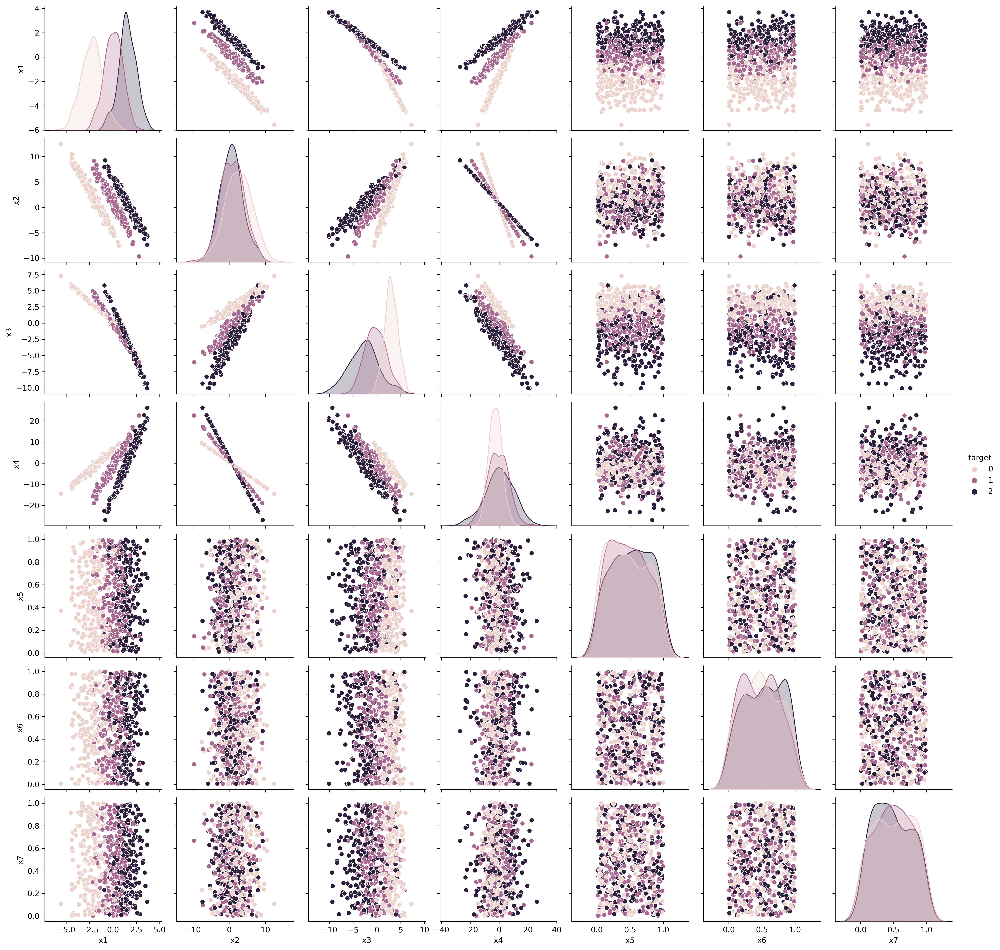

In [732]:
n_samples = 600
random_state = 170

# make 3-class dataset for classification
centers = [[-7.5, -0.8], [1.5, 0.6], [8.5, 2.1]]
X, y = datasets.make_blobs(
    n_samples=n_samples, centers=centers, random_state=random_state
)
transformation = [[0.4, -0.7], [-0.95, 3.4]]
X = np.dot(X, transformation)
X_new, y = datasets.make_blobs(
    n_samples=n_samples, centers=centers, cluster_std=[1.2,2.2,3.2], random_state=random_state)
transformation_new = [[-0.5, 0.7], [0.95, -3.4]]
X_new = np.dot(X_new, transformation_new)
X = np.concatenate((X, X_new), axis=1)
X_no_use = np.random.rand(n_samples, 3)
X = np.concatenate((X, X_no_use), axis=1)

df = pd.DataFrame(data=X, columns=['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7'])
df['target'] = y
sns.pairplot(df, hue='target', vars=['x1', 'x2', 'x3', 'x4', 'x5', 'x6', 'x7'])

In [733]:
X = StandardScaler().fit_transform(X)

Tree depth: 10


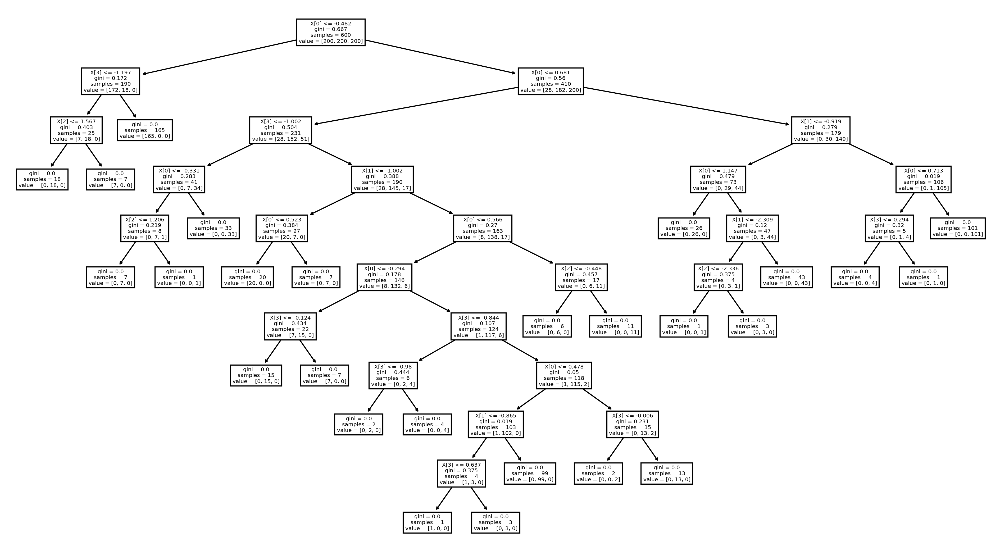

In [734]:
clf = DecisionTreeClassifier()
clf = clf.fit(X, y)
tree_depth = clf.get_depth()
print("Tree depth:", tree_depth)
tree.plot_tree(clf)
plt.show()

In [728]:
from sklearn.manifold import TSNE
from numpy import reshape